In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [19]:

df = pd.read_csv("../data/clean_data_with_splits.csv")

In [20]:
#X = df["Class"]
#Y = df["Border"]
features = pd.read_csv("../data/extracted_features_extended.csv")


In [21]:
features["2_3_lesions"]=df["2_3_lesions"]
features["group_id"]=df["group_id"]
features["Class"]=df["Class"]

In [22]:
cols = ['Asymmetry', 'Compactness', 'Convexity']
for col in cols:
    avg_val = features[col].mean()
    features.loc[features['2_3_lesions'] == True, col] = avg_val
features.to_csv('../data/extracted_features_extended_mean.csv', index=False)

In [23]:
features_final = pd.read_csv("../data/extracted_features_extended_mean.csv")

In [24]:
train_groups = ['a', 'b', 'c', 'd']
train_features = features_final[features_final['group_id'].isin(train_groups)]

In [25]:
#Since pairplot uses all columns, make a copy of df with just features columns

feature_cols = ["Asymmetry", "Compactness", "Convexity", "Multicolor", "red_pixels", "blue_pixels", "mean_red", "mean_blue", "Entropy", "Hue_Var", "Sat_Var", "Val_Var"]

train_df = train_features[feature_cols + ["Class"]].copy()
train_df

,Asymmetry,Compactness,Convexity,Multicolor,red_pixels,blue_pixels,mean_red,mean_blue,Entropy,Hue_Var,Sat_Var,Val_Var,Class
0,0.19834,10.029848,0.894840,183.966947,99.982759,0.000000,154.277241,45.944655,0.762362,0.002586,0.034640,0.017572,True
2,0.24752,10.064621,0.951783,103.543192,93.050783,0.000000,207.546774,172.468041,1.397095,0.014067,0.003336,0.002817,True
3,0.23648,9.356164,0.982207,116.380166,99.982199,0.000000,196.796340,94.158357,0.780121,0.002711,0.020639,0.005455,False
4,0.15144,10.755980,0.987811,72.676531,100.000000,0.000000,169.633271,89.081821,0.583352,0.001808,0.005444,0.001730,True
5,0.09582,9.042060,0.964240,94.040079,99.774605,0.000000,154.948337,119.878975,1.319189,0.011182,0.003673,0.006943,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1729,0.15464,10.777900,0.965229,66.988730,96.402091,0.000000,190.772172,152.824074,1.210521,0.013794,0.005908,0.002145,False
1730,0.22284,14.063679,0.877016,67.152750,93.112606,0.022527,111.985677,79.362575,1.521849,0.037078,0.008164,0.003500,True
1731,0.13616,9.521869,0.965200,64.841604,100.000000,0.000000,184.164135,115.961881,0.453276,0.001202,0.003256,0.003695,True
1732,0.07566,8.573423,0.992025,76.809860,100.000000,0.000000,189.383923,132.497480,0.410247,0.001518,0.005452,0.002749,True


In [26]:
#since pairplot only uses numeric values, make a new column label with numeric values and drop "Class"

train_df["label"] = train_df["Class"].astype(int)
train_df = train_df.drop(columns=["Class"])

In [27]:
g = sns.pairplot(train_df, hue='label', palette="Set1", height=7, diag_kind="hist")

g.fig.suptitle("Pairwise Feature Relationships by Class", y=1.05)

g._legend.set_bbox_to_anchor((0.86, 0.44))

g._legend.set_frame_on(True)
frame = g._legend.get_frame()
frame.set_edgecolor("gray")
frame.set_linewidth(0.8)
frame.set_facecolor("white")

# create a label saying red is malignant and blue is benign


plt.show()

This above plot shows strong overlap between melanoma and non-melanoma classes across most features. Some correlations exist (like asymmetry and convexity), but individual features do not clearly separate the classes. This tells us that classification requires combining features or considering non linear classifier.

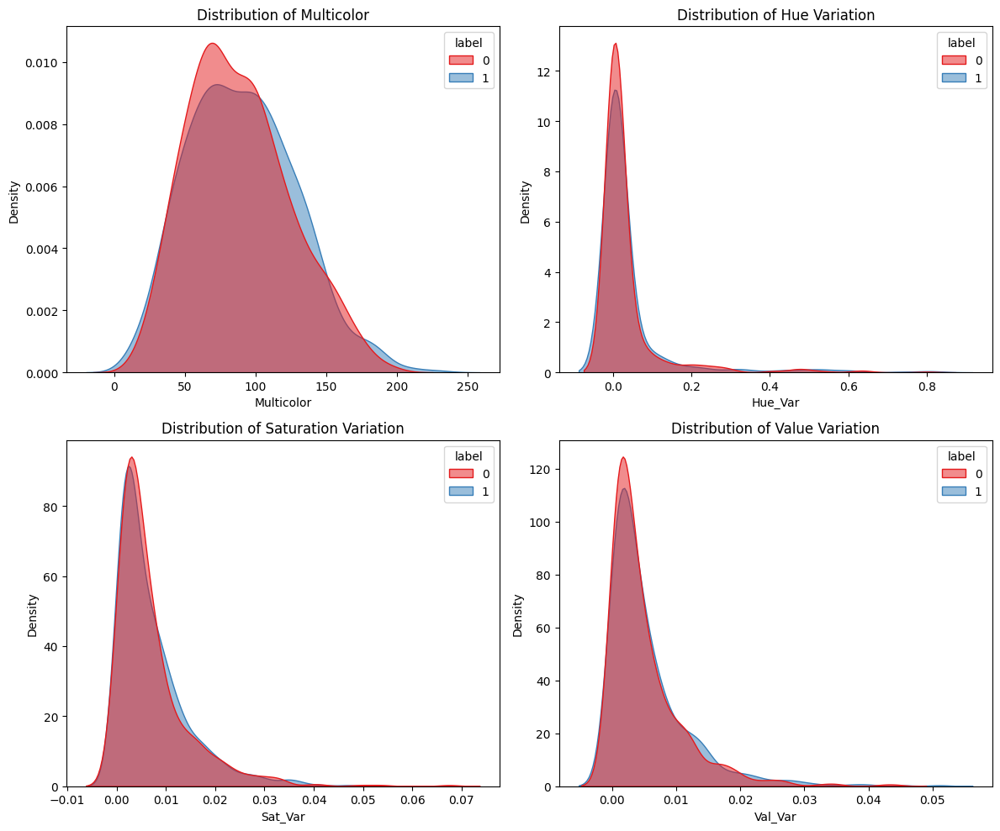

In [28]:
#Density plots for color features

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

sns.kdeplot(data=train_df, x="Multicolor", hue="label", palette="Set1", fill= True, alpha= 0.5, common_norm=False, ax=axes[0, 0])
axes[0, 0].set_title("Distribution of Multicolor")
sns.kdeplot(data=train_df, x="Hue_Var", hue="label", palette="Set1", fill= True, alpha= 0.5, common_norm=False, ax=axes[0, 1])
axes[0, 1].set_title("Distribution of Hue Variation")
sns.kdeplot(data=train_df, x="Sat_Var", hue="label", palette="Set1", fill= True, alpha= 0.5, common_norm=False, ax=axes[1, 0])
axes[1, 0].set_title("Distribution of Saturation Variation")
sns.kdeplot(data=train_df, x="Val_Var", hue="label", palette="Set1", fill= True, alpha= 0.5, common_norm=False, ax=axes[1, 1])
axes[1, 1].set_title("Distribution of Value Variation")

plt.tight_layout()
plt.show()



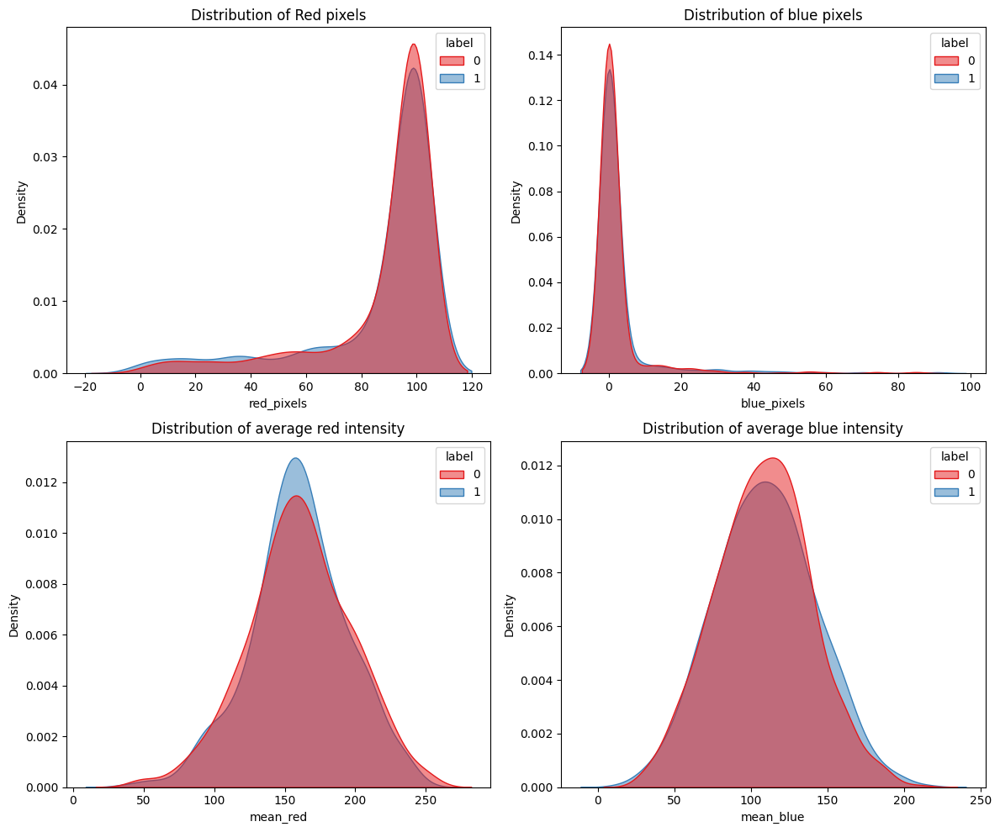

In [29]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

sns.kdeplot(data=train_df, x="red_pixels", hue="label", palette="Set1", fill= True, alpha= 0.5, common_norm=False, ax=axes[0, 0])
axes[0, 0].set_title("Distribution of Red pixels")
sns.kdeplot(data=train_df, x="blue_pixels", hue="label", palette="Set1", fill= True, alpha= 0.5, common_norm=False, ax=axes[0, 1])
axes[0, 1].set_title("Distribution of blue pixels")
sns.kdeplot(data=train_df, x="mean_red", hue="label", palette="Set1", fill= True, alpha= 0.5, common_norm=False, ax=axes[1, 0])
axes[1, 0].set_title("Distribution of average red intensity")
sns.kdeplot(data=train_df, x="mean_blue", hue="label", palette="Set1", fill= True, alpha= 0.5, common_norm=False, ax=axes[1, 1])
axes[1, 1].set_title("Distribution of average blue intensity")

plt.tight_layout()
plt.show()

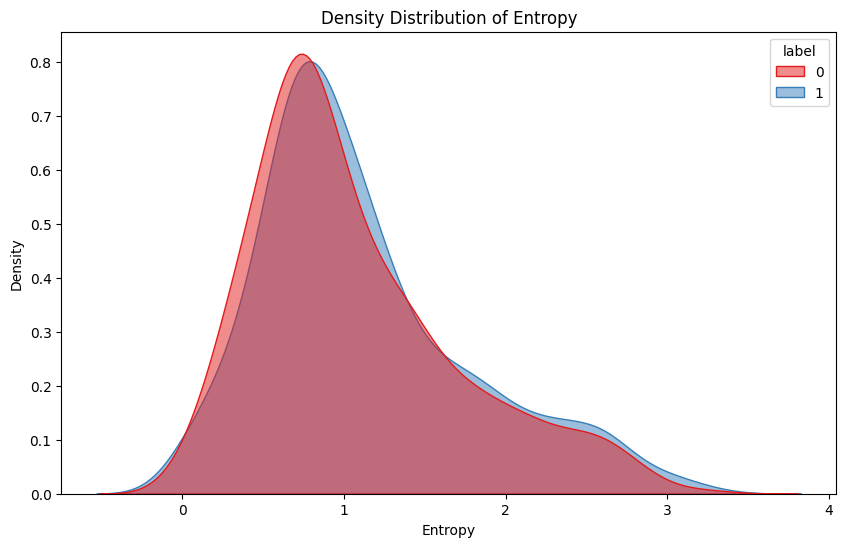

In [30]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=train_df, x='Entropy', hue="label", palette="Set1", fill= True, alpha= 0.5, common_norm=False)
plt.title('Density Distribution of Entropy')
plt.show()

Text(0.5, 1.0, 'Feature distribution by label')

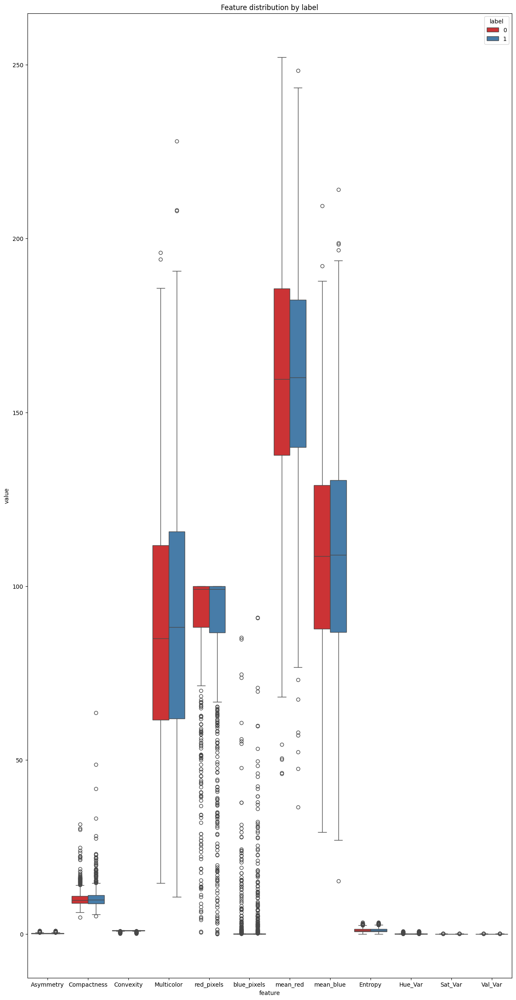

In [31]:
# Melt the dataframe so all features are in one 'feature' column
df_melted = train_df.melt(id_vars='label', var_name='feature', value_name='value')

plt.figure(figsize=(15, 30))
ax = sns.boxplot(data=df_melted, x="feature", y="value", hue="label", palette="Set1")
ax.set_title("Feature distribution by label")

In [32]:
from sklearn.preprocessing import StandardScaler

# List of features I want to scale
color_features = ["Multicolor", "Hue_Var", "Sat_Var", "Val_Var"]
object = StandardScaler()

#Create a copy of df
df_scaled = df.copy()

# standardization 
df_scaled[color_features] = object.fit_transform(df[color_features])


KeyError: "None of [Index(['Multicolor', 'Hue_Var', 'Sat_Var', 'Val_Var'], dtype='str')] are in the [columns]"

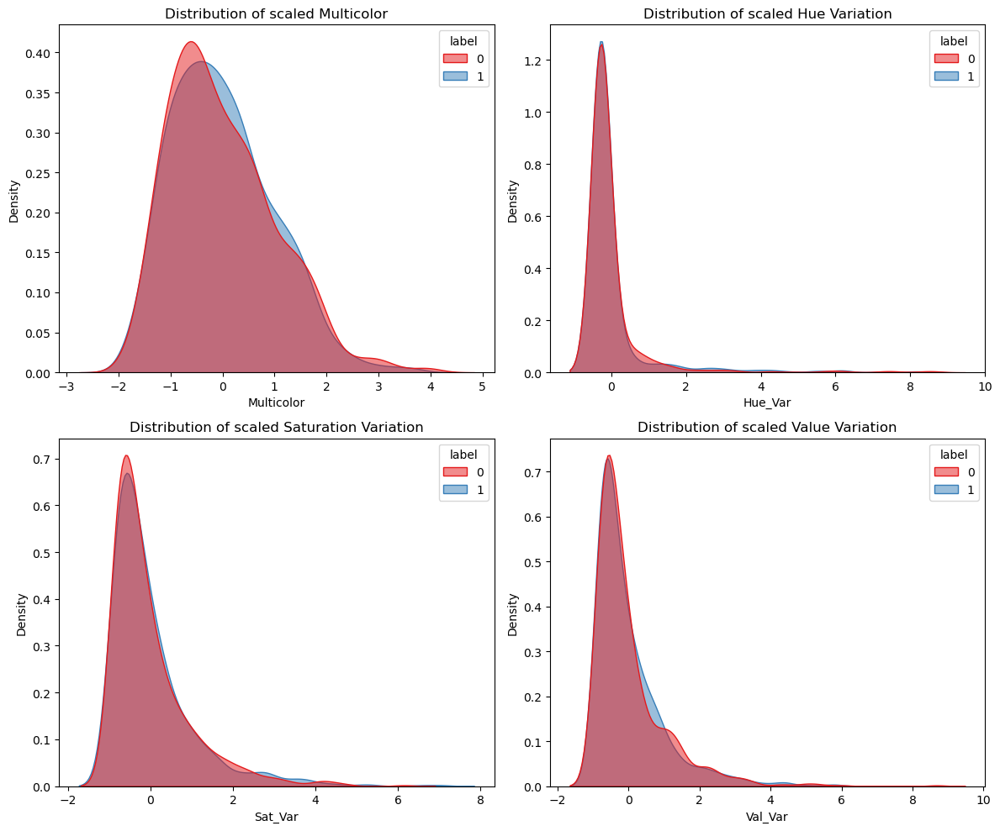

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

sns.kdeplot(data=df_scaled, x="Multicolor", hue="label", palette="Set1", fill= True, alpha= 0.5, common_norm=False, ax=axes[0, 0])
axes[0, 0].set_title("Distribution of scaled Multicolor")
sns.kdeplot(data=df_scaled, x="Hue_Var", hue="label", palette="Set1", fill= True, alpha= 0.5, common_norm=False, ax=axes[0, 1])
axes[0, 1].set_title("Distribution of scaled Hue Variation")
sns.kdeplot(data=df_scaled, x="Sat_Var", hue="label", palette="Set1", fill= True, alpha= 0.5, common_norm=False, ax=axes[1, 0])
axes[1, 0].set_title("Distribution of scaled Saturation Variation")
sns.kdeplot(data=df_scaled, x="Val_Var", hue="label", palette="Set1", fill= True, alpha= 0.5, common_norm=False, ax=axes[1, 1])
axes[1, 1].set_title("Distribution of scaled Value Variation")

plt.tight_layout()
plt.show()

Standardizing the features centered the distributions at zero but did not improve class separation. This reveals that the overlap is not a result of different units across features, but rather is inbuilt to the data itself.